# First Theoretical Session July 22/2024
### From Jupiters to Earths: Current Status and Future Prospects with Direct Imaging.
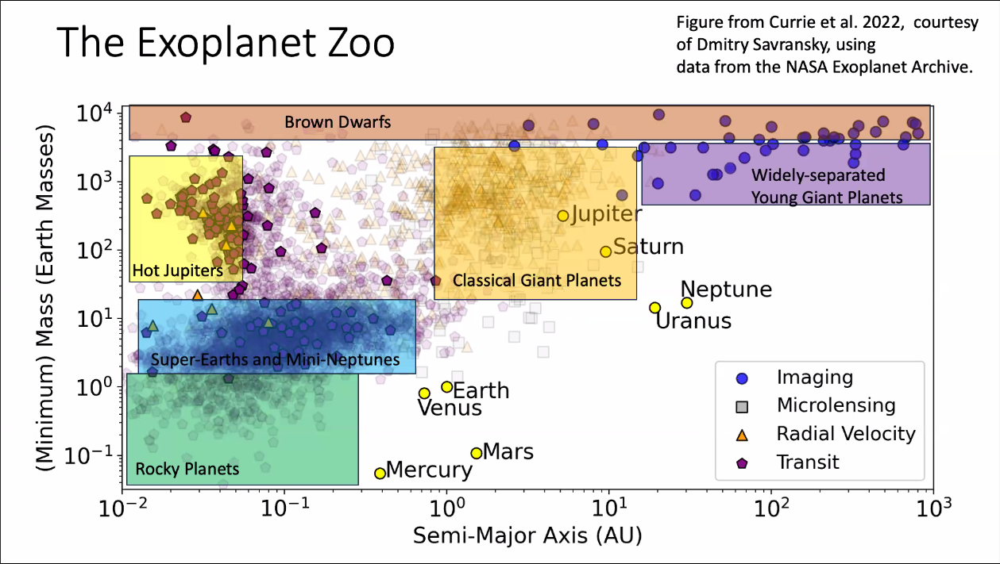

**Current status**

Indirect detection is the most common way to detect planets. Direct Imaging can be usefull, it probes planets in formation, even the protoplanetary disks are observable! Also, the spectra allows to see the atmosphere. Now we observe young and hot planets(Baby Jupiters), eventually we expect to detect exo earth twins. Most detection is made on near IR using 8-m ground based telescopes + adaptative optics + coronography

**Challenges**

* Very good resolution is nedeed
* High contrast, the idea is to ignore light that is not from the planet
* Coronagraph used for optical starlight supression
* Speckle noise still remains, post processing techniques nedeed to remove noise

**Spectral Type Evolution**
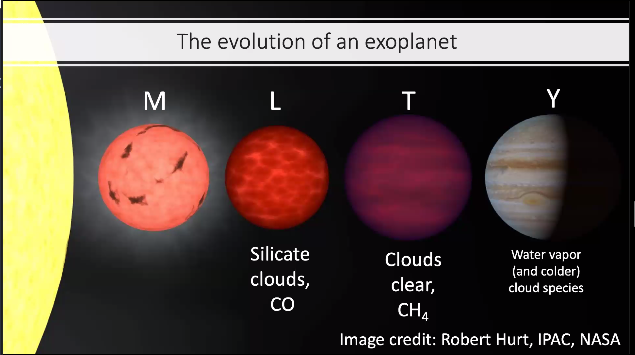

* Spectroscopy and Photometry reveal (primarily red) dusty photospheres for Young explonates
* T dwarfs were expected to be the norm, they weren't
* JWST gives more detailed spectrum, more lines are observed
* Silicate clouds observed caused by particles on the amosphere
* Bolometric lightcurve is very sinusoidal

**Where to observe for planets**

* Previous surveys focused on thermal emission from young planets, as they were hotter there
* Now, combination of direct imaging and Gaia/Hipparcos survey
* Interferometric by using masking that divides 1 telescope in different parts or using multiple apertures.
* JWST is the key. It has high sensitivity to separate saturn-mass planets

### Fourier Optics Theory and Fundamentals
**What's light?**

Photons! an image is basically photons captured. Geometry optics dont explain astro photos. We have to understand the optics as a wave. Concretelly, a Electromagnetic wave 

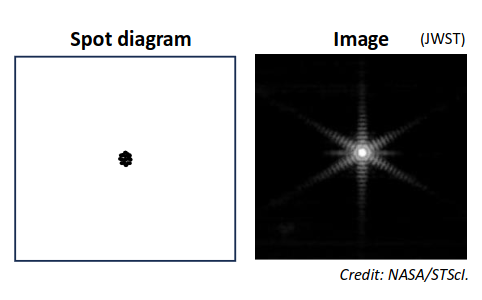  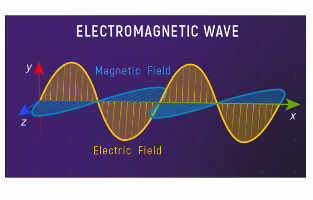

High Constrast Instruments allows to approximate the vector field of EM wave to a scalar field. Point sources far away like stars can be thought as a wave front when they reach us.

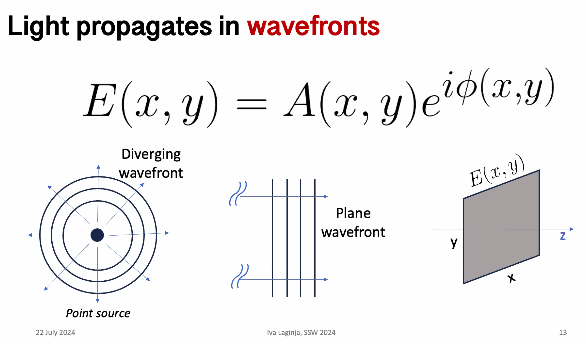

Wave fronts propagate perpendicular to the direction of propagation. 

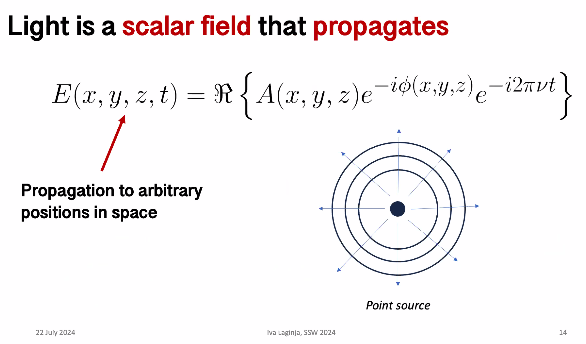

Optical wavefront reach optical system and it gives a changed output depending on the used optical sistem. There are fourier transformations between the states of E

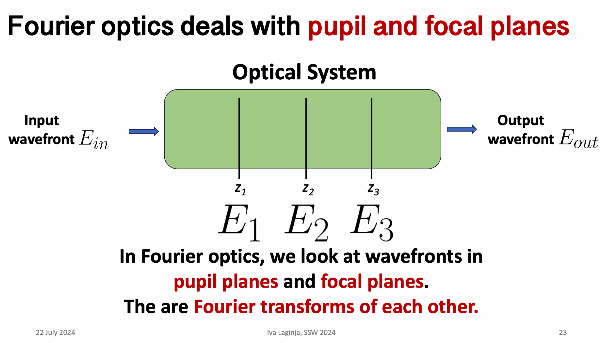

Pupil plane is the telescope receptor, focal plane is where the image is formed
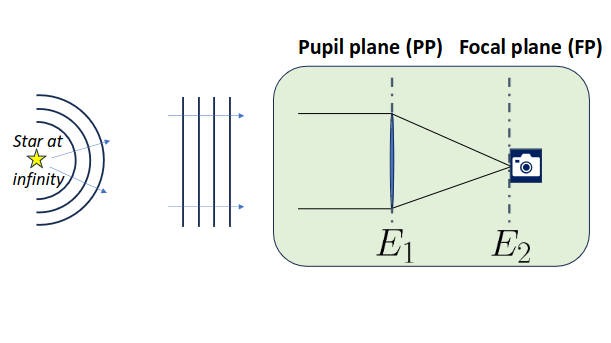
Lens are able to focus in a point, so they are fourier transformers
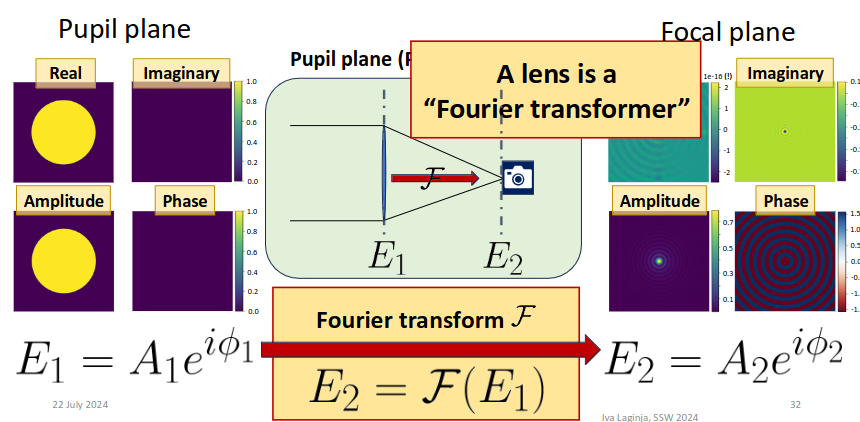
Changing the aperture changes the images. If something grows in the aperture, then the focal plane gets diminished. Change in the angle of observation changes the PSF, it gets shifted.

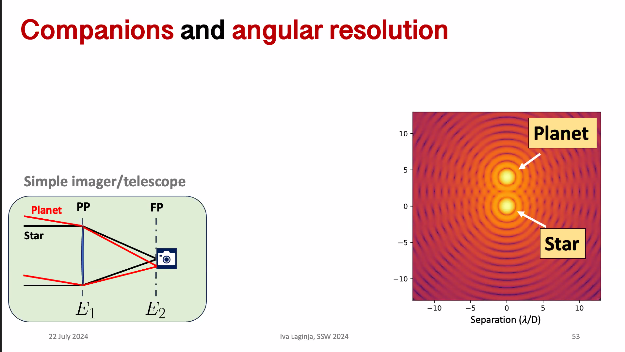 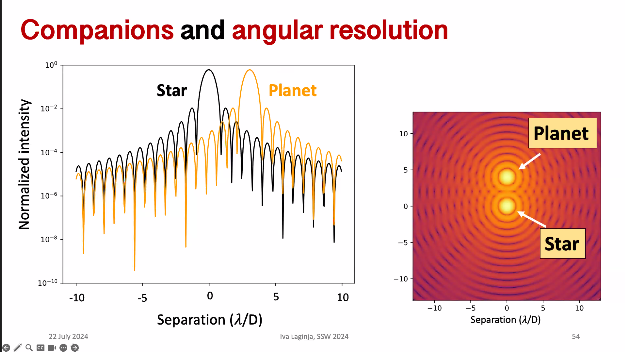

2 components can be seen depending on the angle on which they enter the aperture. Usually one PSF is fainter, as the planet has lesser intensity. If the planet is closer to the star, then its hard to see, if the contrast between the components is low then it is also hard to see. That is why young planets are easier to observe.

**Optical Aberration**

Amplitude and Phase are usually components of the Field observed that has values that are changed due to different sources. For example, the atmosphere produces changes in the light wave phase. Linear combination of sine waves can produce the aberration effects.

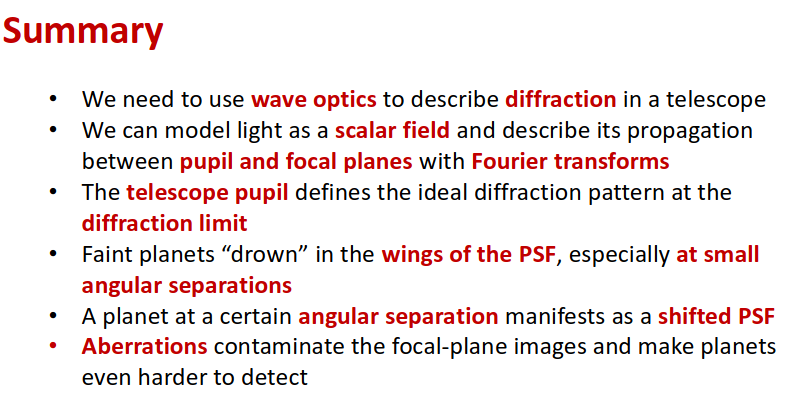


### Coronagraph

Used to block light on an object to observe other, usually the starlight is blocked, so the planet can be observed. The Lyot Mask is usefull to block the starlight peak intensity.

Using the Lyot coronagraph, some of the starlight is blocked. However is still not good enough. Remember we can encounter planets near the star, so it is hard to know how much to block. usually it respects the Inner Working Angle, inside that part, it is possible to encounter planets.

**Vortex Coronagraph**

* Stars should have a small diameter for it to work better
* it takes the ligth and makes it destroy itself destructively at the center of focal plane

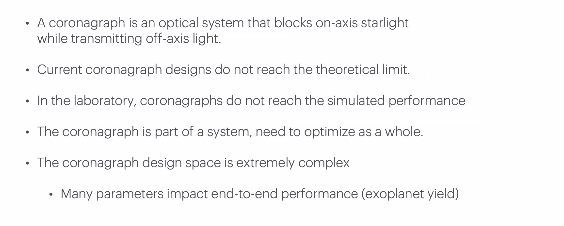

Nedeed because trying to search for a planet without one we will need a millenia with 6.5 m aperture, atleast with trying to obtain a SNR of 5.

What type of noise sources we expect when using a coronagraph?
* Enviromentals of the telescope, read noise, detector saturation
* Some starlight always passes through, star bightness, exozodiacal dust, etc
* Wavefront aberration, atmosferic aberration, chromatic error, thermal error.

* ~70 hours is nedeed for a good observation of SNR 5

**Imaging**

Gives 1D data

**Integral field Spectroscopy**

allows to obtain datacube with wavelenght and xy positions. pupil plane changes produce multiple changes in the focal plane. The idea is to design a mask on the coronagraph to obtain what we want. the idea is to reduce the exposition time to observe things around the star.


# SSW2024 Workshop 1 HCIPy Handout

## Author: Emiel Por (Space Telescope Science Institute)
This tutorial will cover the following four topics.

1.   Installing HCIPy
2.   An introduction to HCIPy Terminology
3.   How to propagate through a coronagraph.
4.   Aberrations and coronagraphs.


## Introduction

Coronagraphs are an integral part of any high-contrast imaging system. Numerical modelling is **the** tool to analyse the performance of modern coronagraphs. 

This session is meant to demonstrate how to use a numerical optical model to simulate the performance and behavior of coronagraphs. HCIPY stands for High Contrast Imaging 

In [ ]:
# Install HCIPy and tqdm
# (https://docs.hcipy.org/dev/installation.html)
!pip install hcipy
!pip install tqdm

In [19]:
import hcipy
import scipy.misc
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm # This creates progress bar in simulations

In [2]:
def make_animation(f, parameter_name, parameter_values, framerate=5, **kwargs):
    ''' A helper function that generates a video  by scanning through a simulation parameter.

    Parameters
    ------------
      f : function
        The function that is being evaluated.
      parameter_name : str
        The parameter that is being varied.
      parameter_values : iterable
        The values, or ranges, of the parameter_name.
      framerate : int
        The number of frames per second for the generated video.

    Returns
    ------------
    FFMpegWriter
      The writer that generates the video.

    '''
   # Video creation, name parameter will vary, mp4 extension, 5 frames per second
    mw = hcipy.FFMpegWriter(f'{f.__name__}_{parameter_name}.mp4', framerate=framerate)
   # for loop for progess bar 
    for p in tqdm(parameter_values):
        plt.clf()
# this calls the parameter and assigns a index value
        f(**{parameter_name: p}, **kwargs)
        plt.suptitle(f'{parameter_name} = {p}')

        mw.add_frame() # adds plot to video in each frame
        plt.close() # closes figure to free up memory in iteration
    mw.close()

    return mw

## HCIPy Terminology
Optical simulations of coronagraphs make use of Fourier transforms. However, there are many different numerical implementations and definitions. HCIPy has developed a framework to handle this in a way where the end user does not have to worry anymore about sampling and energy conservation.

* **Point spread function**: The PSF is the Intensity distribution of light in the focal plane of the telescope, represents how a point source(like a star) is imaged by the tleescope, including effects produced by the aperture or any imperfection in the optical system.


* **Coronagraphs**: Telescope attachments designed to block the direct light from star or bright objects in the vicinity of a low brigthness source that we want to observe

* **Fraunhofer Diffraction**: Fraunhofer diffraction occurs when plane waves are diffracted. In Astronomy, light waves (due to the high distance) get converted to plane waves, when they go through the telescope aperture. Then the wave shapes according to the telescope aperture structure. This modified wavefronts undergoes diffraction due to obstructions within the telescope aperture. The diffraction process results in the point spread function image.


In [3]:
# We make the grids on which the simulation is defined.
# pupil grid represents the plane where the telescope's aperture is defined
# pupilg grid with 128 points across aperture diameter
pupil_grid = hcipy.make_pupil_grid(128) 

# The Focal grid is the plane where the image or point spread function is formed
# Grid sample goes from -16 lam/D to 16 lam/D with 5 pixels per lam/D.
# D is the aperture diameter
focal_grid = hcipy.make_focal_grid(5, 16)

# Propagator models how light waves travel from pupil(telescope) aperture plane to focal plane
# Propagator will compute Fraunhofer diffracttion pattern from pupil to focal grid
# in focal plane the image(point spread function) is formed

# Propagation simulated wave
prop = hcipy.FraunhoferPropagator(pupil_grid, focal_grid)

def pupil_focal_planes(obscuration=0, num_spiders=4, spider_width=0, wavelength=1):
# obscuration: fraction of the aperture telescope that is blocked by components of the telescope
# spiders are thin structural supports that hold secondary mirror
# they introduce diffraction effects when entering to the telescope.
    ''' A function that generates a pupil and its corresponding PSF.

    Parameters
    ------------
      obscuration - float
        The obscuration ratio of the telescope aperture in percentage (0.3=30%)
      num_spiders - int
        The number of spiders in the aperture.
      spider_width - float
        The width of the spiders in physical units (e.g. meters).
    '''
    # ap is a central aperture with spider vanes
    ap = hcipy.make_obstructed_circular_aperture(1, obscuration, num_spiders, spider_width)
    # evaluate aperture in the pupil grid
    pup = hcipy.evaluate_supersampled(ap, pupil_grid, 4)
    # wavefront creation, represents optical field at the pupil plane
    wf = hcipy.Wavefront(pup, wavelength)
    
    # propagate wave to focal plane, computes intensity distribution 
    psf = prop(wf).power
    psf /= psf.max() # Normalized PSF, dividing value psf by its max value

    plt.subplot(1,2,1)
    hcipy.imshow_field(pup, cmap='gray')
    plt.xlabel('x / D')
    plt.ylabel('y / D')
    plt.subplot(1,2,2)
    hcipy.imshow_field(np.log10(psf), cmap='inferno', vmax=0, vmin=-6)

In [4]:
# Point Spread Function creation from a clear aperture with different Wavelength
make_animation(pupil_focal_planes, 'wavelength', np.linspace(0.5, 2.0, 31))
# Increasing wavelength results in a larger Airy disk, longer wavelength bigger central bright spot
# Airy disk becomes larger and the contrast of the PSF decreases
# Airy Disk is an optical phenomena due to the wave nature of light
# when light goes through a circular aperture it gets diffracted showing interference

# wavelength increases, then contrast between central peak and surrounding decreases
# THis is due to the light spreading more at longer wavelenghts 

100%|████████████████████████████████████████████████████████████████| 31/31 [00:09<00:00,  3.29it/s]


Wavefront can be approximated as a plane wave when it reaches the telescope aperture (pupil plane), due to it high distance. Then, it gets diffracted and finally it is propagated to the focal plane where the PSF is formed

#### **Physical fields**
HCIPy is built on top of several physical and mathematical concepts. The most import concept here is the concept of a Field. A field is any scalar, vectorial or tensorial physical quantity that varies with a spatial coordinate: $F(\vec{r})$. 

Scalar field is temperature. In a room the temperature changes depending on where you are measuring it. While the coordinates itself could be a vector (e.g. x, y and z), the output of a field could be different.Temperature is a scalar field. Only one value corresponds to each spatial position. 

Vector field is the velocity of flowing water. In a river, water is flowing but at each point in the river the velocity ($v_x$, $v_y$ and $v_z$) is different. 

Tensorial fields are fields that have (potentially) varying tensors at each spatial point. An example is the Cauchy stress tensor that describes the pressure and stresses within a material. If we look at a wing of an airplane during flight, the stress tensor is different for each part of the wing.



#### **Grid**
HCIPy is built up using the concept of fields. Everything is a field. The transmission as a function of position,the amount of birefringence or the phase delay are fields. These could all vary over space and are therefore a **Field**.

However, physical fields also require the coordinates that are associated with the field values! HCIPy implemented this by requiring that fields have a value and a so called **Grid** on which the values are defined. In the cell below we make a uniform grid that has 11x11 points but a different size in the horizontal (1 meter) and vertical direction (2 meters).

In [5]:
grid = hcipy.make_uniform_grid([11, 11], [1.0, 2.0]) # 11 x 11 elements
# we can change the dispersion between points with the second bracket, in axis x or y

We can plot the coordinates and show all the points in the new grid that we made. Notice how we access the x and y coordinates.

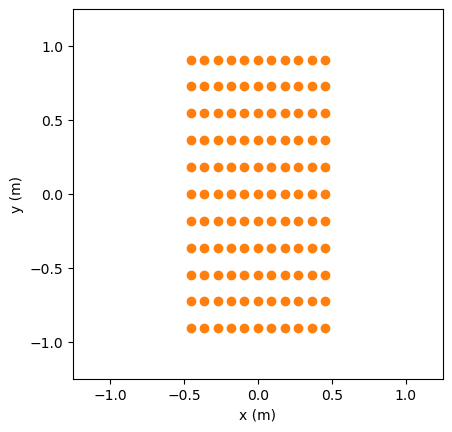

In [6]:
plt.plot(grid.x, grid.y, 'o', color='C1') # plot 11x11 elements
plt.xlabel('x (m)') # label x axis
plt.ylabel('y (m)') # label y axis
plt.xlim([-1.25, 1.25]) # axis limit
plt.ylim([-1.25, 1.25]) # axis limit
plt.gca().set_aspect('equal', adjustable='box') # apply axis to figure
plt.show()

#### **Pupil plane grids**
The function
```
hcipy.make_uniform_grid
```
makes arbitrary uniformely sampled grids. This means it can make an one dimensional grid or a two dimensional grid or even for arbitrary dimensions. This is why you need to supply a list of samples and a list of sizes for each dimension. In general, most optics are flat and are described by a two dimensional plane. Another property is that they are usually also rotationally symmetric and we need a similar horizontal and vertical size. Typing two numbers for both dimensions constantly is annoying which is why we made a couple helper functions to make it easier to generate grids for certain planes. The number one function that you will use is

```
hcipy.make_pupil_grid(num_pixels, physical_size)
```
This function needs the number of pixel across one dimension and the size. Then it will create a two dimensional grid. This is very helpful for all the pupil plane optics.

#### **Focal plane grids**

Focal plane grids are defined in terms of the spatial resolution or in other words, the diffraction-limit. The syntax for making focal plane grids is a bit more complicated than that of  pupil grids.

In [19]:
hcipy.make_focal_grid? #for more information

We are interested in the signature of the code. This is the way you call that particalur function.
```
hcipy.make_focal_grid(q, num_airy, spatial_resolution=None, pupil_diameter=None, focal_length=None, f_number=None, reference_wavelength=None)
```
Due to legacy reasons the make_focal_grid function has many parameters. **You should only use q, num_airy and spatial_resolution**. The other parameters were used in older versions of HCIPy and they will be deprecated in future versions.

A focal plane is usually defined in terms of field of view (number of resolution elements) and the sampling per resolution element. And that is exactly the way we will use this function. The number of pixels per resolution element is ```q``` and ```num_airy``` is the half size of the grid in terms of resolution elements. So if ```num_airy``` is set to 10, the grid will run from -10 to 10. And finally, we need to tell the function how large a spatial resolution element is.


#### **Fields**
We can now define a field if it is defined for a particular grid. Let's try to make our own circular function. We will need to start by defining a grid.

In [7]:
# We make a grid with a size of 1.1 meters sampled by 128 pixels across.
circle_mask_grid = hcipy.make_pupil_grid(128, 1.1)

With the grid defined it is now time to make a circle. Each grid has associated coordinates. The basic grids in HCIPy are Cartesian so you can get access to the x and y coordinates. Let's make our circular function using those variables.

In [8]:
def make_tutorial_circle(circle_diameter, grid):
    # Let's get access to the x and y coordinates
    x = grid.x
    y = grid.y

    # And now calculate the radius
    r = np.sqrt(x**2 + y**2)

    # And we make the binary mask
    mask = r < (circle_diameter / 2)

    # Binary masks are not great to work with if we need to multiply it with
    # other arrays. Therefore, I cast the array to an array of floats.
    # And finally, we create our Field by passing the values and the associated grid.
    return hcipy.Field(mask.astype(float), grid)

In [9]:
tutorial_mask = make_tutorial_circle(1.0, circle_mask_grid)

Okay we made the mask. How can we plot it? Well, HCIPy has a several convenience plotting functions that seamlessly operate on fields. Let's plot our circle function!

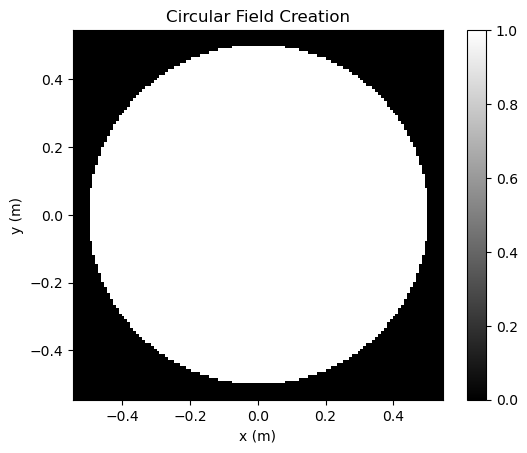

In [10]:
hcipy.imshow_field(tutorial_mask, cmap='gray')
plt.colorbar()
plt.xlabel('x (m)')
plt.ylabel('y (m)')
plt.title('Circular Field Creation')
plt.show()

The native implementation of circular apertures use the code ```hcipy.make_circular_aperture(circle_diameter)```. This is a function generator. That means that this function creates a new function that can be called. This approach is very common in the HCIPy library. The reason why this has been done is to facilitate multiple grids withour redefining your aperture.

Suppose you have an aperture of 1 meter

In [11]:
tutorial_aperture = hcipy.make_circular_aperture(1)

and your code needs to run on two different resolutions for whatever reason. Then it would be painful to recreate your aperture everytime. With function generators this only needs to be done once. The aperture I just defined is a function that can evaluated on **any** grid! And only when it has been evaluated will it become something physical that we can work with. This piece of code evaluates our pupil on a low resolution grid

In [12]:
low_res_grid = hcipy.make_pupil_grid(32, 1.1)
pupil_low_res = tutorial_aperture(low_res_grid) # 32 pixels

However because of the HCIPy flexibility we can also evaluate it on a higher resolution grid

In [13]:
high_res_grid = hcipy.make_pupil_grid(512, 1.1)
pupil_high_res = tutorial_aperture(high_res_grid) # 512 pixels

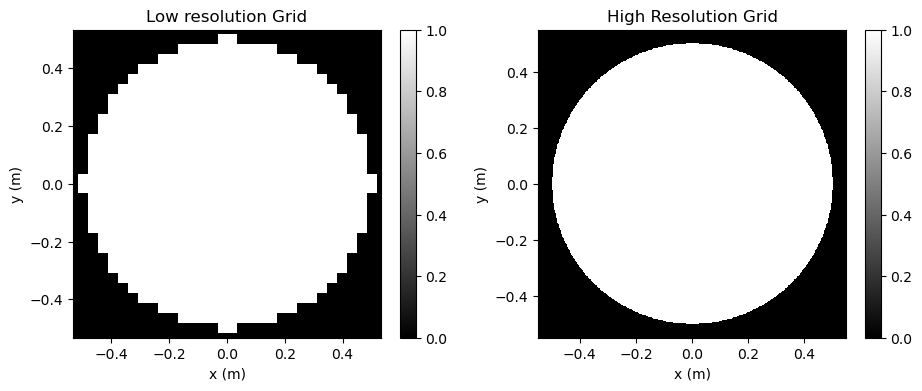

In [14]:
# Using aperture 1 with different wavelenght
plt.figure(figsize=(11,4))
plt.subplot(1,2,1)
plt.title('Low resolution Grid')
hcipy.imshow_field(pupil_low_res, cmap='gray')
plt.colorbar()
plt.xlabel('x (m)')
plt.ylabel('y (m)')

plt.subplot(1,2,2)
hcipy.imshow_field(pupil_high_res, cmap='gray')
plt.colorbar()
plt.xlabel('x (m)')
plt.title('High Resolution Grid')
plt.ylabel('y (m)')
plt.show()

#### **Wavefronts and optical elements**
**Wavefront** is the highest level element in HCIPy. Wavefronts consists of an electric field (a **Field** object), a wavelength, a polarization state and its total power (the number of photons).

In [36]:
hcipy.Wavefront? # Documentation
# Electrical Field is the most important
# if only Electric field is specified
# lambda is 1, ligth is unpolarized, stokes factor of 0
# photons is the sum of intensity that comes from E Field

SyntaxError: invalid syntax (108567851.py, line 1)

So we will use the **Wavefront** class to create wavefronts that can interact with optical elements. An **OpticalElement** is a HCIPy class that can modifiy a wavefront. Examples of optical elements are a transmission filter or a lens. They can also be more abstract because anything that transforms a wavefront into another wavefront is an optical element. Even the **FraunhoferPropagator** propagates a wavefront from the pupil plane to the focal plane and is counted as an **OpticalElement**!

Here I show how the Fraunhofer propagator is created in HCIPy. This propagator object propagates a wavefront from the pupil to the focal plane. It is created by using
```
propagator = hcipy.FraunhoferPropagator(pupil_grid, focal_grid)
```
The propagator can now be used to propagate the wavefront.

PS: sometimes we omit certain parameters in the ```make_pupil_grid``` or ```make_focal_grid``` functions. These have a default value of 1. So if you think a parameter is 'missing' in the function call, it's probably set to 1 by default.

#### **Summary of HCIPy Terminology**
**Fields**, fundamental building block of all the classes and methods. Set on a particular collection of spatial points defined by the **Grids**. The field objects can be combined with other functionality to create **Wavefronts** and **Optical Elements**. Lot of different PSFs can be generated.

## Apertures and PSFs.

In the lecture, you learned about pupil and focal planes and how the electric field propagates from one to the other. Here we'll put to use that knowledge to look at how different pupil geometries impact the shape of the point spread function (PSF).

**Note:** remember that there is a Fourier transform relation between the pupil and the focal plane. Therefore, everything that is wide in one plane becomes narrow in the other plane.

In [15]:
make_animation(pupil_focal_planes, 'obscuration', np.linspace(0, 0.99, 11))
# higher obscuration reduce central peak intensity 
# sidelobes (surrounding rings) becomes more pronounced
# less sharp PSF shape, decreased contrast

100%|████████████████████████████████████████████████████████████████| 11/11 [00:02<00:00,  4.26it/s]


In [16]:
make_animation(pupil_focal_planes, 'num_spiders', range(8), spider_width=0.01)
# more spider vanes makes more diffraction spikes around the PSF
# reduces PSF peak intensity

100%|██████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  4.58it/s]


In [17]:
make_animation(pupil_focal_planes, 'spider_width', np.linspace(0, 0.1, 51), num_spiders=4)
# increasing spider width produce a broader cross like pattern on the psf
# blocks more light, stronger diffraction spikes

100%|████████████████████████████████████████████████████████████████| 51/51 [00:11<00:00,  4.62it/s]


#### <font color="red">**Questions**</font>
Explore the PSF behavior.

1. **Explain what the central obscuration parameter does to your image.**

    Higher obscuration reduces the peak intensity of the PSF, aswell as reducing the contrast between the center peak with the rings. The rings are sidelobes product of the diffraction. higher obscuration produces brighter rings. thus reducing the contrast.

2. **Set the number of spiders to 4. Explain what the spider width does to your PSF.**
    
    Spiders vanes reduce the peak intensity of the PSF, more Spiders produce more diffraction spikes around the central ring. With 4 we obtain a cross like shape that extend radially from the central peak

3. **Explain what the number of spiders does to your PSF. How many stripes do you see? Does this explain what you expect from what you heard about Fourier optics this morning?**

    More spiders produce more diffraction spikes around the central ring, reducing even more the peak intensity of the point spread function

#### All the telescope geometries you have ever cared about
The code block below demonstrates all the different telescopes that are currently coded up in HCIPy. Have a look at them and see if you can understand the PSF features from the aperture shape.

In [21]:
aperture_list = [
    hcipy.make_elt_aperture,
    hcipy.make_gmt_aperture,
    hcipy.make_tmt_aperture,
    hcipy.make_magellan_aperture,
    hcipy.make_luvoir_a_aperture,
    hcipy.make_luvoir_b_aperture,
    hcipy.make_hale_aperture,
    hcipy.make_vlt_aperture,
    hcipy.make_habex_aperture,
    hcipy.make_hst_aperture,
    hcipy.make_jwst_aperture
    #hcipy.make_keck_aperture
]

telescope_names = [
    'ELT',
    'GMT',
    'TMT',
    'Magellan',
    'Luvoir - A',
    'Luvoir - B',
    'Hale',
    'VLT',
    'Habex',
    'HST',
    'JWST',
    'Keck'
]

mw = hcipy.FFMpegWriter('various_telescope_geometries.mp4', framerate=1)

#plt.figure(figsize=(11,4))
for i in tqdm(range(len(aperture_list))):
  ap = aperture_list[i]
  label = telescope_names[i]

  telescope_aperture = hcipy.evaluate_supersampled(ap(normalized=True), pupil_grid, 4)
  wf = hcipy.Wavefront(telescope_aperture)
  psf = prop(wf).power
  psf /= psf.max()

  plt.figure(figsize=(11,4))
  plt.suptitle( '{:s} aperture and PSF'.format(label) )

  plt.subplot(1,2,1)
  hcipy.imshow_field(telescope_aperture, cmap='gray')
  plt.colorbar()

  plt.subplot(1,2,2)
  hcipy.imshow_psf(psf, vmax=1, vmin=1e-6)

  mw.add_frame()
  plt.close()

mw.close()

mw

100%|████████████████████████████████████████████████████████████████| 11/11 [00:07<00:00,  1.38it/s]


## Light through a vortex coronagraph

We'll use the vortex coronagraph for our example, but there are many other coronagraphs implemented in HCIPy. The vortex coronagraph theoretically removes all starlight if the telescope aperture is a clear circular aperture. This is similar to the aperture that has been simulated for the Habex telescope in the previous block. That was of course no coincidence! The Habex telescope was designed for a vortex coronagraph high-contrast imaging mission.

### Set up

We'll start by creating the masks of the vortex coronagraph. We'll slightly enlarge the diameter of our pupil grid, to more clearly be able to see the effects of the vortex coronagraph in the Lyot stop.

A typical coronagraph manipulates the light at 3 planes. The entrance pupil plane, a focal plane and the final pupil plane where the Lyot stop is placed. The mask for each of these three planes needs to be defined. The first mask is easy. It is just the telescope pupil aperture.

For the focal plane mask, we'll use a charge 2 vortex coronagraph. Charge 2 means that the phase in the focal-plane mask goes from 0 to $2\pi$ twice azimuthally. Charges for vortex coronagraphs are even, so the charge can be 2, 4, 6, etc. Let's make an image of the vortex focal plane mask.

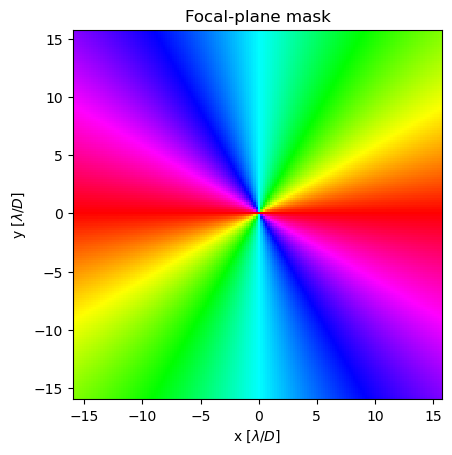

In [22]:
charge = 2 # phases wrap around the center of the mask, winds 2 times around the center

plt.title('Focal-plane mask')
# polar coordinates, as the vortex mask phase depends on angle to the center
# imshow displays 2d field on the grid
hcipy.imshow_field(np.exp(1j * charge * focal_grid.as_('polar').theta), focal_grid, vmin=0)
plt.xlabel('x [$\lambda/D$]')
plt.ylabel('y [$\lambda/D$]')
plt.show()
# note that the center is not that well designed

The shape of the mask looks like a vortex, which is why this particular coronagraph is called the vortex coronagraph.

#### On-axis nulling performance
Now let's make the apertures for the other planes.

In [23]:
pupil_diameter = 1
# Lyot mask placed in the reimaged pupil plane, has to match the diffraction pattern
# It blocks the diffracted starlight while allowing light from off axis source to pass
# The lyot mask must be smaller than the pupil diameter.
lyot_mask_diameter = 0.95
# pupil plane is where the aperture image is formed
# focal plane is where the light converges to form an image

pupil_grid = hcipy.make_pupil_grid(1024, diameter=2) # 1024 pixels
prop = hcipy.FraunhoferPropagator(pupil_grid, focal_grid)

# Here we supersample the pupil to smooth the effects of pixel sampling on sharp edges of the pupil.
# This reduces the effects of numerical alliasing.
pupil = hcipy.evaluate_supersampled(hcipy.make_circular_aperture(pupil_diameter), pupil_grid, 4)

vortex = hcipy.VortexCoronagraph(pupil_grid, charge=charge)

lyot_mask = hcipy.evaluate_supersampled(hcipy.make_circular_aperture(lyot_mask_diameter), pupil_grid, 4)
lyot_stop = hcipy.Apodizer(lyot_mask)
# apodizer blocks specific parts of wavefront based on the lyot mask pattern

And we'll show each of the relevant masks here.

Lyot stop blocks the corresponding parts of the diffraction pattern due to components like the spider vanes. reducing residual starlight in the final image, as a result, faint nearby objects become more visible. It is located in the re imaged pupil plane. That is, where the image forms after entering the aperture. 

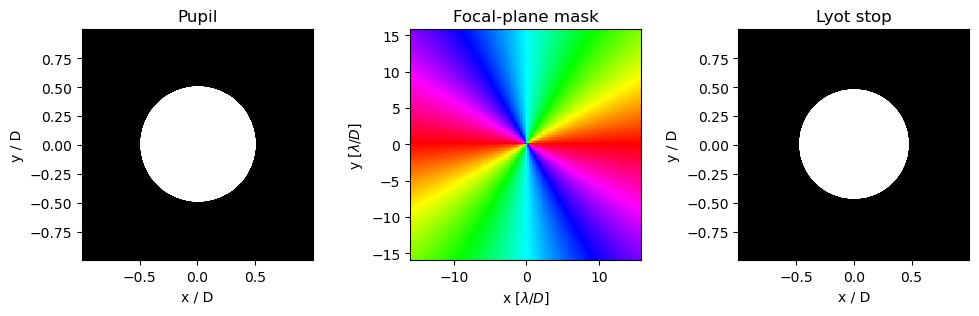

In [24]:
plt.figure(figsize=(12, 3))

plt.subplot(1, 3, 1)
plt.title('Pupil')
hcipy.imshow_field(pupil, cmap='gray')
plt.xlabel('x / D')
plt.ylabel('y / D')

plt.subplot(1, 3, 2)
plt.title('Focal-plane mask')
hcipy.imshow_field(np.exp(1j * charge * focal_grid.as_('polar').theta), focal_grid, vmin=0)
plt.xlabel('x [$\lambda/D$]')
plt.ylabel('y [$\lambda/D$]')

plt.subplot(1, 3, 3)
plt.title('Lyot stop')
hcipy.imshow_field(lyot_mask, cmap='gray')
plt.xlabel('x / D')
plt.ylabel('y / D')

plt.show()

A common way to normalize the images is to normalize by the peak flux of an off-axis source at large angular separation. A quick way to calculate this PSF is to propagate light through the coronagraph without the focal-plane mask.

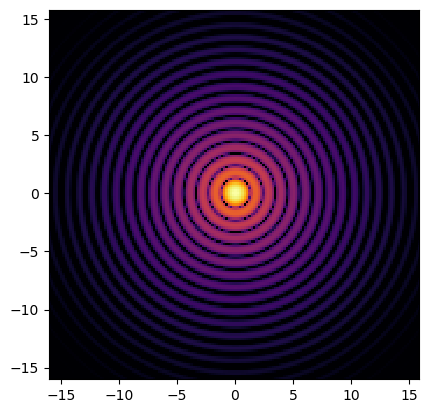

In [25]:
wf = hcipy.Wavefront(pupil)
img_ref = prop(lyot_stop(wf)).intensity
# Normalize intensity
hcipy.imshow_field(np.log10(img_ref / img_ref.max()), cmap='inferno', vmin=-5)
plt.show()

Let's now propagate light through each of the planes of the coronagraph. For clarity, we'll show the light at the FPM as well, though this is usually calculated internally in HCIPy for extra accuracy. Numerically accuracy is important for high contrast imaging simulations. Remember that we are trying to searh for signals at the $10^{-10}$ level.

Numerical noise from double precision simulations is on the order of $10^{-15}$ at the single pixel level. Adding pixel increases this noise by $\sqrt{N}$. A 1024x1024 pixel area already pushes the numerical noise to $10^{-11}$. Now imaging that we also need to perform multiple operations. This means that naive implementations of certain coronagraphs quickly run into numerical noise effects.

Therefore, HCIPy implements specific numerical methods for different coronagraphs to increase the robustness and accuray of the simulations. This also means that the output of a coronagraph class might not be what you expect. In HCIPy, we have chosen to have coronagraphs propagate from the entrance pupil to just before the Lyot stop. So the output of the coronagraph optics are pupil planes and not focal planes!

Let's get down to business!

In [26]:
# We create the wavefront we want to propagate
wf = hcipy.Wavefront(pupil)

# We propagate the wavefront to a focal plane as a reference image
fpm_img = prop(wf)

# We propagate the wavefront through the vortex coronagraph
pre_lyot_plane = vortex(wf)

# The vortex coronagraph ends just before the Lyot stop so we still need to apply the Lyot stop.
post_lyot_plane = lyot_stop(pre_lyot_plane)

# Finally, we propagate the Lyot stop wavefront to the science focal plane.
# And we create the coronagraphic focal plane image.
science_img = prop(post_lyot_plane)

And then we can show them. Let's wrap everything in a function that propagates a wavefront then plots all planes for convenience.

In [27]:
def plot_vortex_coronagraph_planes(wf):
    '''
    Parameters
    ------------
    wf - Wavefront
      The wavefront that will be propagated through the coronagraph system.
    '''

    # We propagate the wavefront to the focal plane to get the reference image
    fpm_img = prop(wf)

    # Propagate through the vortex coronagraph and the Lyot stop
    pre_lyot_plane = vortex(wf)
    post_lyot_plane = lyot_stop(pre_lyot_plane)

    # And finally, we propagate to the science focal plane again
    science_img = prop(post_lyot_plane)

    # The plotting code
    plt.figure(figsize=(8, 6))

    plt.subplot(2, 3, 1)
    plt.title('At pupil')
    hcipy.imshow_field(wf.intensity, cmap='inferno')
    plt.xlabel('x / D')
    plt.ylabel('y / D')

    plt.subplot(2, 3, 2)
    plt.title('At FPM')
    hcipy.imshow_field(np.log10(fpm_img.intensity / img_ref.max()), vmin=-5, vmax=0, cmap='inferno')
    plt.plot(0, 0, 'w+')
    plt.xlabel('x [$\lambda/D$]')
    plt.ylabel('y [$\lambda/D$]')

    plt.subplot(2, 3, 3)
    plt.title('At Lyot stop')
    hcipy.imshow_field(pre_lyot_plane.intensity, cmap='inferno', vmax=2)
    plt.xlabel('x / D')
    plt.ylabel('y / D')

    plt.subplot(2, 3, 4)
    plt.title('The Lyot stop')
    hcipy.imshow_field(lyot_stop.apodization / lyot_stop.apodization.max(), cmap='gray', vmax=1, vmin=0)
    plt.xlabel('x / D')
    plt.ylabel('y / D')

    plt.subplot(2, 3, 5)
    plt.title('After Lyot stop')
    hcipy.imshow_field(post_lyot_plane.intensity, cmap='inferno', vmax=2)
    plt.xlabel('x / D')
    plt.ylabel('y / D')

    plt.subplot(2, 3, 6)
    plt.title('At science camera')
    hcipy.imshow_field(np.log10(science_img.intensity / img_ref.max()), vmin=-5, vmax=0, cmap='inferno')
    plt.xlabel('x [$\lambda/D$]')
    plt.ylabel('y [$\lambda/D$]')

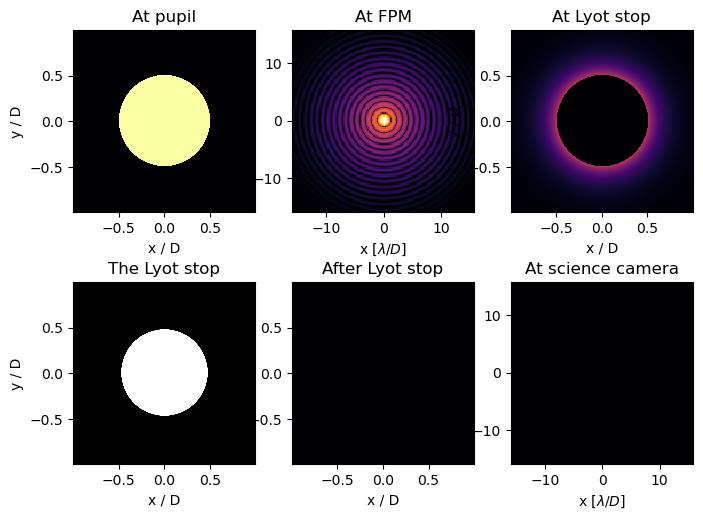

In [28]:
# We create a diffraction-limit wavefront.
wf = hcipy.Wavefront(pupil)

# And we send it through the coronagraph and we output its images.
plot_vortex_coronagraph_planes(wf)
plt.show()

The final science camera image is completely dark! The coronagraph worked and did its job correctly. We lost all the starlight.

### Off-axis sources

While suppressing on-axis light is one of the critical parameters of a coronagraph, it is not the only one that matters. Off-axis throughput is just as important, if not more. For example, one of the best ways to completely remove starlight is to close your telescope. You will not detect any starlight. So, job well done right? Well no. In that case we also don't detect any planet light. What the coronagraph needs to do is minimize the amount of starlight while maximizing the throughput of an off-axis companion.

Let's calculate the off-axis transmission of the vortex coronagraph. Before that though, let's first see how light from off-axis sources propagate through the vortex coronagraph. We'll use a source at 1.5 $\lambda/D$ to start with.

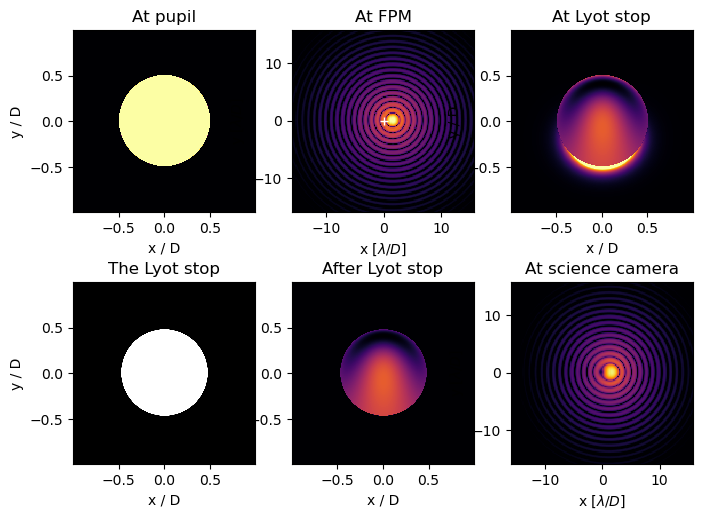

In [29]:
# Notice how we modify the initial electric field of the wavefront?
wf_offaxis = hcipy.Wavefront(pupil * np.exp(2j * np.pi * pupil_grid.x * 1.5))

plot_vortex_coronagraph_planes(wf_offaxis)
plt.show()
# Focal plane mask = FPM

### Questions - coronagraph performance
1. Make an animation of all planes in the vortex coronagraph with the source moving from 0 to 10 $\lambda/D$ angular separation.
2. Off-axis sources located towards the left-right seems to have the light pushed towards the top/bottom in the Lyot plane. Can you find a qualitative explanation for this? Hints: what shape does the vortex mask impart on an off-axis companion? And, how dow shifts and tilts relate to each other in Fourier transform pairs?
3. Increase the charge of the vortex mask to 4, 6, 8, etc... Explain qualitatively what the charge does to the images.
4. Bonus: what does the image of a vortex coronagraph with odd charges look like?
5. Bonus: Verify for yourself why the tilt we applied in the previous code block creates a PSF at 1.5 $\lambda/D$.

In [36]:
# 1.
def plot_vortex_coronagraph_offaxis(offaxis_angle):
    wf = hcipy.Wavefront(pupil * np.exp(2j * np.pi * pupil_grid.x * offaxis_angle))
    plot_vortex_coronagraph_planes(wf)

make_animation(plot_vortex_coronagraph_offaxis, 'offaxis_angle', np.linspace(0, 10, 41))


100%|████████████████████████████████████████████████████████████████████| 41/41 [02:07<00:00,  3.10s/it]


<Figure size 640x480 with 0 Axes>

Let's now look at the throughput of the off-axis source. One of the current favourite ways of computing throughput is using aperture photometry. The choice of aperture is however still a hotly debated topic. In this session, we will investigate only one. This throughput metric uses a photometric aperture centered on the off-axis source with a radius of 1 $\lambda/D$. This radius has been selected to capture the majority of the flux. The image below shows the size of the photometric aperture with respect to the PSF.

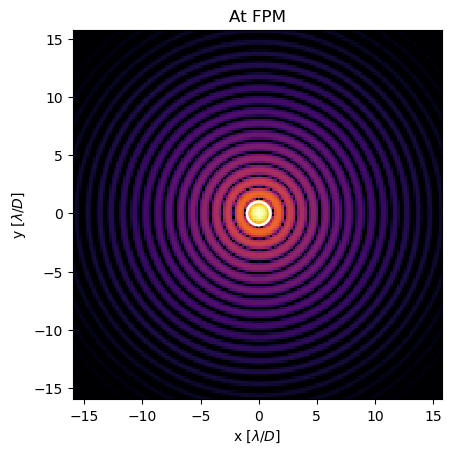

In [30]:
# We create the wavefront we want to propagate
wf = hcipy.Wavefront(pupil)

# We propagate the wavefront to a focal plane as a reference image
fpm_img = prop(wf)

plt.title('At FPM')
hcipy.imshow_field(np.log10(fpm_img.intensity / img_ref.max()), vmin=-5, vmax=0, cmap='inferno')
plt.plot(0, 0, 'w+')
plt.xlabel('x [$\lambda/D$]')
plt.ylabel('y [$\lambda/D$]')

circ = plt.Circle((0,0), 1.0, fill=False, lw=2, color='white')
plt.gca().add_patch(circ)

The throughput is then defined as the total power inside that aperture divided by the incident power on the telescope. All propagations in HCIPy will conserve power, unless blocked by that optical element. This means that we can simply prepare an incoming wavefront with a total power of 1, compute the coronagraphic image, and then sum all flux inside the photometric aperture.

Let's do that now.

In [31]:
angular_separations = np.linspace(0, 10, 101)
throughputs = []

for angular_separation in tqdm(angular_separations):
    wf = hcipy.Wavefront(pupil * np.exp(2j * np.pi * pupil_grid.x * angular_separation))
    wf.total_power = 1

    pre_lyot_plane = vortex(wf)
    post_lyot_plane = lyot_stop(pre_lyot_plane)
    science_img = prop(post_lyot_plane)

    photometric_aperture_function = hcipy.make_circular_aperture(2.0, center=[angular_separation, 0])
    photometric_aperture = hcipy.evaluate_supersampled(photometric_aperture_function, focal_grid, 4)

    throughput = (science_img.power * photometric_aperture).sum()
    throughputs.append(throughput)

100%|██████████████████████████████████████████████████████████████| 101/101 [01:17<00:00,  1.30it/s]


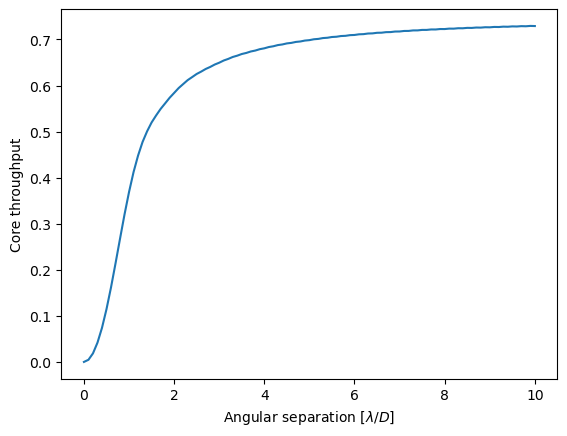

In [32]:
plt.plot(angular_separations, throughputs)
plt.xlabel('Angular separation [$\lambda/D$]')
plt.ylabel('Core throughput')
plt.show()

### Questions - coronagraphic throughput

1. The core throughput doesn't asymptotically go to one. Why shouldn't it go to one?
2. Compute the maximum core throughput at infinite angular separation. Hint: we did something like this before when computing the reference PSF.
3. Compute the inner working angle (the angular separation where the core throughput reaches half of the maximum core throughput) of the charge 2 vortex coronagraph.
4. Plot the core throughput of higher charges (charge 4, 6, 8, etc...) in the same plot. What does this look like? How does inner working angle change?

## Coronagraphs and pupil geometry
The vortex coronagraph works extremely well for circular clear apertures. We have shown that it perfectely removes any on-axis star. However, what is its performance for other pupil geometries?

In [33]:
def pupil_to_vortex_focal_planes(obscuration=0, num_spiders=4, spider_width=0, wavelength=1):
    ''' A function that generates a pupil and its corresponding cornagraphic PSF.

    Parameters
    ------------
      obscuration - float
        The obscuration ratio of the telescope aperture in percentage.
      num_spiders - int
        The number of spiders in the aperture.
      spider_width - float
        The width of the spiders in physical units (e.g. meters).
    '''
    ap = hcipy.make_obstructed_circular_aperture(1, obscuration, num_spiders, spider_width)
    pup = hcipy.evaluate_supersampled(ap, pupil_grid, 4)

    lyot_ap = hcipy.make_obstructed_circular_aperture(0.95, 1.05 * obscuration, num_spiders, 2 * spider_width)
    lyot_stop = hcipy.Apodizer( hcipy.evaluate_supersampled(lyot_ap, pupil_grid, 4) )

    wf = hcipy.Wavefront(pup, wavelength)
    plot_vortex_coronagraph_planes(wf)

make_animation(pupil_to_vortex_focal_planes, 'obscuration', np.linspace(0, 0.5, 3))

100%|██████████████████████████████████████████████████████████████████████| 3/3 [00:21<00:00,  7.15s/it]


<Figure size 640x480 with 0 Axes>

We see that addding a central obscuration causes a lot of light that leaks through the coronagraph. Therefore, we can not think of the coronagraph as a separate problem from the pupil geometry. Each new pupil needs a new coronagraph!

## Aberrations and coronagraphy
The lectures have explained aberrations. These aberrations change our instrument performance and will leak through the coronograph. Let's fix the parameters of our pupil and explore what aberrations do to our focal-plane image. To simplify interpretation of the images, we limit outselves at first to sinusoidal aberrations. **We are using a different pupil and focal grid for the next couple of blocks because we are now interesting in looking at different things. Don't forget which pupil and focal grids are for which simulations! Later in the tutorial, we will switch back again to the grids for the Vortex coronagraph!**

In [37]:
# First we define the parameters of our telescope
obscuration = 0.1
num_spiders = 6
spider_width = 0.01

aberration_pupil_grid = hcipy.make_pupil_grid(256, 1.1)

# Making the new aperture
ap = hcipy.make_obstructed_circular_aperture(1, obscuration, num_spiders, spider_width)
aberration_pupil = ap(aberration_pupil_grid)

# And make a new propagator
aberration_prop = hcipy.FraunhoferPropagator(aberration_pupil_grid, focal_grid)

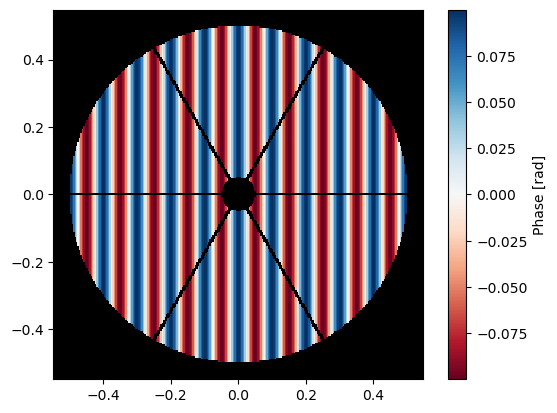

In [38]:
pos_x = 10
pos_y = 0
amplitude = 0.1
phase = 0

aberration = amplitude * np.cos(2 * np.pi * (pos_x * aberration_pupil_grid.x + pos_y * aberration_pupil_grid.y) + phase)
aberration = hcipy.Field(aberration, aberration_pupil_grid)

hcipy.imshow_field(aberration, cmap='RdBu', mask=aberration_pupil)
plt.colorbar().set_label('Phase [rad]')
plt.show()

### Bonus question

Can you predict what the focal-plane is going to look like with this phase aberration on the pupil? Hint: what is the Fourier transform of a sinusoid?

In [39]:
def speckle(pos_x=8, pos_y=0, amplitude=0.3, phase=0):
    aberration = amplitude * np.cos(2 * np.pi * (pos_x * aberration_pupil_grid.x + pos_y * aberration_pupil_grid.y) + phase)

    wf = hcipy.Wavefront(aberration_pupil)

    wf.electric_field *= np.exp(1j * aberration)

    psf = aberration_prop(wf).power
    psf /= psf.max()

    plt.subplot(1,2,1)
    hcipy.imshow_field(wf.phase, cmap='RdBu', mask=aberration_pupil, vmin=-1, vmax=1)
    plt.xlabel('x / D')
    plt.ylabel('y / D')
    plt.colorbar()
    plt.subplot(1,2,2)
    hcipy.imshow_field(np.log10(psf), cmap='inferno', vmax=0, vmin=-6)

### Questions

1. What does the amplitude of the sinusoidal aberration do in the focal plane?
2. What does the pos_x parameter do to the sinusoidal aberration? What effect does that have on the two speckles in the focal plane?
3. What does the phase parameter do to the sinusoidal aberration? What effect does that have on the appearance of the two speckles in the focal plane?
4. Bonus: can you find a qualitative explanation for your answer to question 3? Hint: think of even and odd functions, and their Fourier transform.

In [40]:
make_animation(speckle, 'amplitude', np.linspace(0, 1, 21))

100%|████████████████████████████████████████████████████████████████████| 21/21 [00:05<00:00,  3.62it/s]


In [41]:
make_animation(speckle, 'pos_x', np.linspace(0, 10, 21))

100%|████████████████████████████████████████████████████████████████████| 21/21 [00:05<00:00,  3.95it/s]


In [42]:
make_animation(speckle, 'phase', np.linspace(0, 2 * np.pi, 51), pos_x=10)

100%|████████████████████████████████████████████████████████████████████| 51/51 [00:13<00:00,  3.83it/s]


## Aberrations

You already saw how sinusoidal aberrations create single speckles in the focal plane. While sinusoidal aberrations provide an excellent basis to understanding interference, it does not describe the type of aberrations typically seen in coronagraphic systems. Typically, coronagraphs suppress certain aberrations more than others. In particular, low-order aberrations are passively suppressed by the coronagraph, which impacts requirements on the adaptive optics system. In addition, low-order aberrations are usually much stronger in coronagraphic systems since misalignments and drifts primarily create low-order compared to high-order aberrations.

When evaluating the performance of coronagraphs, we therefore often observe the passive suppression of low-order aberrations more than high-order aberrations. A commonly-used basis, especially for vortex coronagraphs, is the Zernike basis. Zernike modes are implemented in HCIPy. Let's display them first, before working with them.

In [43]:
def plot_zernike(noll_index):
    zernike_indices = hcipy.noll_to_zernike(noll_index)
    mode = hcipy.zernike(*zernike_indices)(aberration_pupil_grid)

    vlim = np.pi

    hcipy.imshow_field(mode, cmap='RdBu', mask=aberration_pupil, vmin=-vlim, vmax=vlim)
    plt.xlabel('x / D')
    plt.ylabel('y / D')
    plt.xlim(-0.75, 0.75)
    plt.ylim(-0.75, 0.75)
    plt.colorbar()

In [44]:
make_animation(plot_zernike, 'noll_index', range(1, 22))

100%|████████████████████████████████████████████████████████████████████| 21/21 [00:04<00:00,  4.63it/s]


Ruane (2018) is an excellent introduction on the behaviour of Zernike aberrations through the vortex coronagraph. Let's recreate the first few figures of this paper.

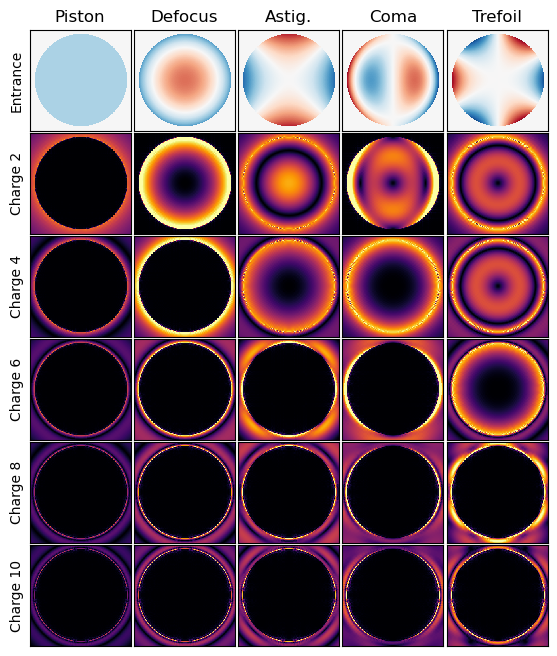

In [45]:
zernike_modes = [
    hcipy.zernike(0, 0),
    hcipy.zernike(2, 0),
    hcipy.zernike(2, 2),
    hcipy.zernike(3, 1),
    hcipy.zernike(3, 3)
]

zernike_labels = [
    'Piston',
    'Defocus',
    'Astig.',
    'Coma',
    'Trefoil'
]

charges = [2, 4, 6, 8, 10]

n = len(charges) + 1
m = len(zernike_modes)

plt.figure(figsize=(6.7, 8))
i = 0

for l, zernike in enumerate(zernike_modes):
    plt.subplot(n, m, i + 1)

    hcipy.imshow_field(zernike(aberration_pupil_grid), cmap='RdBu', vmin=-np.pi, vmax=np.pi)

    plt.gca().xaxis.set_ticks([])
    plt.gca().yaxis.set_ticks([])

    if l == 0:
        plt.ylabel('Entrance')

    plt.title(zernike_labels[l])

    i += 1

for k, charge in enumerate(charges):
    vortex = hcipy.VortexCoronagraph(aberration_pupil_grid, charge=charge)

    for l, zernike in enumerate(zernike_modes):
        wf = hcipy.Wavefront(zernike(aberration_pupil_grid))

        lyot = vortex(wf)

        plt.subplot(n, m, i + 1)
        hcipy.imshow_field(lyot.amplitude, vmax=1.5, cmap='inferno')

        plt.gca().xaxis.set_ticks([])
        plt.gca().yaxis.set_ticks([])

        if l == 0:
            plt.ylabel(f'Charge {charge}')

        i += 1

plt.subplots_adjust(wspace=0.02, hspace=0.02)
plt.show()

Here we see that changing the charge of the vortex coronagraph removes more modes from the incoming wavefront. So higher order charge makes the coronagraph more robust against small misalignments and wavefront aberrations. However, it also increases your inner-working angle. Choosing a particular charge number is therefore a trade-off analysis between inner-working angle and wavefront aberration sensitivity! This behavior is something that you will need to take into account when doing yield studies.

Let's now also investigate how much light is leaked into the coronagraphic focal plane due to each mode and how it scales with the amplitude of the aberration.

15it [01:21,  5.44s/it]


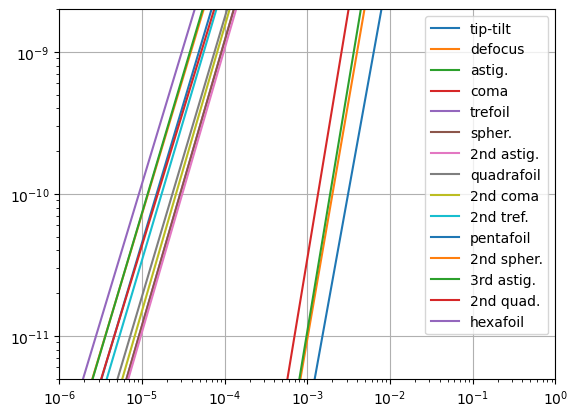

In [46]:
scoring_region = hcipy.make_circular_aperture(3.5 * 2)(focal_grid) - hcipy.make_circular_aperture(2.5 * 2)(focal_grid)
scoring_region = scoring_region > 0.5

vortex = hcipy.VortexCoronagraph(pupil_grid, charge=6)
coro = hcipy.PerfectCoronagraph(pupil)

noll_indices = [2, 4, 5, 7, 10, 9, 12, 17, 19, 23, 25, 34, 32, 28, 37]
zernike_labels = [
    'tip-tilt',
    'defocus',
    'astig.',
    'coma',
    'trefoil',
    'spher.',
    '2nd astig.',
    'quadrafoil',
    '2nd coma',
    '2nd tref.',
    'pentafoil',
    '2nd spher.',
    '3rd astig.',
    '2nd quad.',
    'hexafoil'
]

coeffs = np.linspace(1e-6, 1e0, 7)

for k, noll_index in tqdm(enumerate(noll_indices)):
    aberration = hcipy.zernike(*hcipy.noll_to_zernike(noll_index), radial_cutoff=False)(pupil_grid)

    mean_norm_irradiances = []

    for c in coeffs:
        wf = hcipy.Wavefront(pupil * np.exp(2j * np.pi * c * aberration))
        wf = coro(wf)

        pre_lyot_plane = vortex(wf)
        post_lyot_plane = lyot_stop(pre_lyot_plane)
        science_img = prop(post_lyot_plane)

        norm_irradiance = science_img.intensity / img_ref.max()
        mean_norm_irradiance = np.mean(norm_irradiance[scoring_region])

        #hcipy.imshow_field(np.log10(norm_irradiance * scoring_region), vmin=-11, vmax=-0)
        #plt.show()

        mean_norm_irradiances.append(mean_norm_irradiance)

    plt.plot(coeffs, mean_norm_irradiances, '-', label=zernike_labels[k])

plt.xscale('log')
plt.yscale('log')
plt.xlim(1e-6, 1e0)
plt.ylim(5e-12, 2e-9)
plt.grid()
plt.legend()
plt.show()

#### Questions
This particular combination of vortex coronagraph and the chosen scoring area seem to have two groups of aberrations. Hint: look at the mode filtering figure we made.
1. What is the main difference in the modes themselve between the two group of aberrations?
2. Try to explain the difference in behavior that we are seeing between the two groups.

Now you have finished the hands-on session for optical modeling of coronagraphs. There is another bonus section that is goes through a more advanced simulation with Adaptive Optics. You can go through this one if you have left over time.

## Group project: Fast aberrations and Adaptive Optics

Fast aberrations are any aberrations that vary on timescales faster than the integration time of the imaging camera. Counter to slow aberrations (ie. those that are slower than the integration time of the camera), these aberrations appear as incoherent light. They create a halo of scattered light. In this section, we will simulate a idealized version of an Adaptive Optics system. That will demonstrate some of the ground-based telescope residuals. We will make a simple AO system for the European Extremely Large Telescope.


In [ ]:
# Here we create the simulated atmosphere
elt_pupil_grid = hcipy.make_pupil_grid(256, 42.0)

Cn2 = hcipy.Cn_squared_from_fried_parameter(0.1)
atm = hcipy.InfiniteAtmosphericLayer(elt_pupil_grid, Cn2, L0=100, velocity=20)

Let's make a video showing the typical atmospheric turbulence evolution.

In [ ]:
atm.reset()

t = 0
dt = 0.01

mw = hcipy.FFMpegWriter('atmospheric_phases.mp4', framerate=5)

for i in tqdm(range(21)):
  atm.evolve_until(t)
  phase = atm.phase_for(1)
  phase -= np.mean(phase) # remove piston

  plt.clf()
  hcipy.imshow_field(phase)

  mw.add_frame()
  plt.close()

  t += dt

mw.close()
mw

The atmosphere is evolving in the horizontal direction. The velocity determines how quickly this atmosphere moves across the grid. With this code in hand we can start to make our toy model AO system.

In [ ]:
# Let's make the ELT aperture
elt_pupil = hcipy.evaluate_supersampled(hcipy.make_elt_aperture(), elt_pupil_grid, 4)

# The wavelenth will matter because the atmosphere is chromatic
# Let's use a wavelength of 1 um.
wavelength = 1.0e-6
telescope_diameter = 39.4
spatial_resolution = wavelength / telescope_diameter

elt_focal_grid = hcipy.make_focal_grid(q=3, num_airy=50, spatial_resolution=spatial_resolution)

# And let's use the theoretical perfect coronagraph for the ELT pupil.
elt_coronagraph = hcipy.PerfectCoronagraph(elt_pupil)

elt_prop = hcipy.FraunhoferPropagator(elt_pupil_grid, elt_focal_grid)

Now let's look at the seeing-limited PSFs. Each atmospheric component is also an **OpticalElement**. We propagate a wavefront through the atmosphere in exactly the same we as we propagate any other optical element.

In [ ]:
atm.reset()

t = 0
dt = 0.01

wf = hcipy.Wavefront(elt_pupil, wavelength)
wf.total_power = 1

# Make the reference PSF and measure the peak for Strehl normalization.
ref_img = elt_prop(wf).power
psf_norm = ref_img.max()

# Setup the video
mw = hcipy.FFMpegWriter('AO_psfs.mp4', framerate=5)

for i in tqdm(range(21)):
  atm.evolve_until(t)
  atmosphere_psf = elt_prop(atm(wf)).power

  plt.clf()
  hcipy.imshow_psf(atmosphere_psf / psf_norm, vmax=1, vmin=1e-5)

  mw.add_frame()
  plt.close()

  t += dt

mw.close()
mw

This looks horrible. We only see speckes everywhere! We need to quickly turn on the AO system! The ElT will use it's adaptive secondary mirror to correct the atmospheric turbulence. This mirror roughly has 5000 modes. Such a system corresponds to about 80 actuators across the pupil. So, that is exactly what we will simulate.

In [ ]:
# We start by making a deformable mirror.
num_actuators_across = 80
deformable_mirror = hcipy.PhaseApodizer(elt_pupil_grid.zeros())

# Here we make a very simplified wavefront sensor.
wavefront_sensor = hcipy.FourierFilter(elt_pupil_grid, hcipy.make_circular_aperture(2 * np.pi * num_actuators_across / telescope_diameter))

def make_wfs_measurement(phase):
    return np.real(wavefront_sensor.forward(phase + 0j))

And now we will make a simple AO loop. Just run the code and look at the simulation output. It will take a couple of minutes to run.

In [ ]:
# Reset the atmosphere and the DM
atm.reset()
deformable_mirror.phase = elt_pupil_grid.zeros()

# The simulation parameters
t = 0
dt = 0.001
number_of_iterations = 2000
number_of_skips = 50
control_gain = 0.5

wf = hcipy.Wavefront(elt_pupil, wavelength)
wf.total_power = 1

# Make the reference PSF and measure the peak for Strehl normalization.
ref_img = elt_prop(wf).power
psf_norm = ref_img.max()

# Setup the video
mw = hcipy.FFMpegWriter('AO_psfs.mp4', framerate=5)

long_exposure_psf = 0
long_exposure_coronagraph = 0
num_frames = 0

for i in tqdm(range(number_of_iterations)):
  # Evolve the atmosphere
  atm.evolve_until(t)

  if i % number_of_skips == 0:
    # Get the PSF at the current iteration
    corrected_wavefront = deformable_mirror(atm(wf))

    atmosphere_psf = elt_prop(corrected_wavefront).power
    atmosphere_coronagrapic_image = elt_prop(elt_coronagraph(corrected_wavefront)).power

    if i >= number_of_skips:
      long_exposure_psf = (long_exposure_psf * num_frames + atmosphere_psf) / (num_frames + 1)
      long_exposure_coronagraph = (long_exposure_coronagraph * num_frames + atmosphere_coronagrapic_image) / (num_frames + 1)
      num_frames += 1

  # Go through the AO loop.
  # The wavefront sensor measures the difference between the incoming wavefront and the DM correction
  wavefront_sensor_measurement = make_wfs_measurement(atm.phase_for(wavelength) + deformable_mirror.phase)
  deformable_mirror.phase = deformable_mirror.phase - control_gain * wavefront_sensor_measurement

  t += dt

  if i % number_of_skips == 0:
    # All the plotting
    plt.clf()

    plt.figure(figsize=(11,8))
    plt.subplot(2,2,1)
    hcipy.imshow_psf(atmosphere_psf / psf_norm, vmax=1, vmin=1e-5, spatial_resolution=spatial_resolution)
    plt.xlabel('x ($\lambda / D$)')
    plt.ylabel('y ($\lambda / D$)')

    plt.subplot(2,2,2)
    hcipy.imshow_psf(atmosphere_coronagrapic_image / psf_norm, vmax=1, vmin=1e-5, spatial_resolution=spatial_resolution)
    plt.xlabel('x ($\lambda / D$)')
    plt.ylabel('y ($\lambda / D$)')

    if i >= number_of_skips:
      plt.subplot(2,2,3)
      hcipy.imshow_psf(long_exposure_psf / psf_norm, vmax=1, vmin=1e-5, spatial_resolution=spatial_resolution)
      plt.xlabel('x ($\lambda / D$)')
      plt.ylabel('y ($\lambda / D$)')

      plt.subplot(2,2,4)
      hcipy.imshow_psf(long_exposure_coronagraph / psf_norm, vmax=1, vmin=1e-5, spatial_resolution=spatial_resolution)
      plt.xlabel('x ($\lambda / D$)')
      plt.ylabel('y ($\lambda / D$)')

    mw.add_frame()
    plt.close()

mw.close()
mw

#### Group project questions

1. In which direction do we see the strongest speckles? What physical parameter do you think influences this direction?
2. What happens if you run the simulation again but now with a much higher windspeed. E.g. set the wind speed to 40 m/s.
3. What happens when you change the wind speed direction. Set the wind speed direction to the north. You can do this by passing an array with two elements to the wind velocity ```np.array([0, 20.0])``` in the InfiniteLayerAtmosphere.
4. How do the AO parameters (gain and number of actuators) impact the coronagraphic residuals?
5. What wavelength behavior do you expect? Try it out by changing the wavelength of the simulations.
6. Try and implement a realistic coronagraph for the ELT using either the Vortex Coronagraph or a Lyot Coronagraph.
7. How do the residuals behave with the real coronagraph?

## Group project: Active wavefront control with EFC



Implement the single-sided darkhole digging EFC code from the following tutorial in your own Google Colab notebook. https://docs.hcipy.org/dev/tutorials/ElectricFieldConjugation/ElectricFieldConjugation.html

#### Group project questions


1.   For a system with only a single DM. What is the final contrast that you achieve as a function of input aberration rms? Are you able to achieve deep contrast if the system starts with large aberrations?
2.   Change the code so that it works with a Vortex coronagraph.
3.   Now add spectral bandwidth to the simulation. How does the performance depend on the spectral bandwith? Test it out with 0.1% bandwidth, 1% bandwidth and 10% bandwidth.

